In [89]:
using LinearAlgebra
using FFTW
using Plots
using DelimitedFiles

In [90]:
theta_in_degree = 30;

In [91]:
LDOS_minus = readdlm("LDOS_d+id_minus_theta_$(theta_in_degree)_julia_code_strontium_ruthenate_BdG.csv", ',')
LDOS_plus = readdlm("LDOS_d+id_plus_theta_$(theta_in_degree)_julia_code_strontium_ruthenate_BdG.csv", ',');

LDOS = LDOS_minus + LDOS_plus; ## add the two bands
LDOS_full = copy(LDOS);


In [92]:
# Region of interest for plotting
const ROI_X = 141:261
const ROI_Y = 141:261
const HALO = 3  # because shifts are -3:3

# Validate ROI against loaded LDOS size
nx, ny = size(LDOS)
@assert first(ROI_X)-HALO >= 1 && last(ROI_X)+HALO <= nx "ROI_X with halo is out of LDOS bounds"
@assert first(ROI_Y)-HALO >= 1 && last(ROI_Y)+HALO <= ny "ROI_Y with halo is out of LDOS bounds"

# Source LDOS block needed to compute ROI (ROI + halo)
const SRC_X = (first(ROI_X)-HALO):(last(ROI_X)+HALO)
const SRC_Y = (first(ROI_Y)-HALO):(last(ROI_Y)+HALO)

# Keep only necessary LDOS chunk
LDOS = @view LDOS[SRC_X, SRC_Y]

# Fine grid only over ROI
NFineX = 10 * length(ROI_X)
NFineY = 10 * length(ROI_Y)
x_fine_grid = range(first(ROI_X), last(ROI_X), length=NFineX)
y_fine_grid = range(first(ROI_Y), last(ROI_Y), length=NFineY)

# Global LDOS indices -> local view indices
gx2lx(gx) = gx - first(SRC_X) + 1
gy2ly(gy) = gy - first(SRC_Y) + 1


gy2ly (generic function with 1 method)

In [93]:
using QuadGK

In [94]:
a=1;

In [95]:
## Define a Wannier function within one unit cell
function Wannier_xy_square(x,y)
    sigma_Wannier = 0.8*a;
    return ((x^2 + y^2)/a^2)*exp(-(x^2 + y^2)/(2*sigma_Wannier^2))^2
end

##Normalize Wannier function so that it integrates to 1 over the unit cell
integral = quadgk(x -> quadgk(y -> Wannier_xy_square(x,y), -10*a/2, 10*a/2)[1], -10*a/2, 10*a/2)[1]
println("Integral of Wannier function over unit cell: ", integral)

Integral of Wannier function over unit cell: 1.2867963509103797


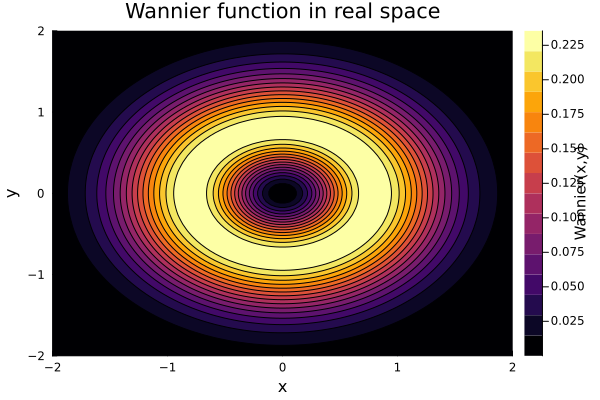

In [96]:
## Make a plot of the Wannier function
x_grid = range(-2*a, 2*a, length=100)
y_grid = range(-2*a, 2*a, length=100)
Wannier_values = [Wannier_xy_square(x,y) for x in x_grid, y in y_grid]
p_Wann = contourf(x_grid, y_grid, Wannier_values', title="Wannier function in real space", xlabel="x", ylabel="y", colorbar_title="Wannier(x,y)")


In [97]:
# Direct (simple) convolution-style Wannier accumulation
Wannier_times_LDOS = zeros(Float64, NFineX, NFineY)
normW = 1 / integral

for ii in 1:NFineX
    x = x_fine_grid[ii]
    x0 = floor(Int, x)
    for jj in 1:NFineY
        y = y_fine_grid[jj]
        y0 = floor(Int, y)

        acc = 0.0
        for sx in -HALO:HALO
            gx = x0 + sx
            lx = gx2lx(gx)
            for sy in -HALO:HALO
                gy = y0 + sy
                ly = gy2ly(gy)
                acc += normW * Wannier_xy_square(x - gx, y - gy) * LDOS[lx, ly]
            end
        end

        Wannier_times_LDOS[ii, jj] = acc
    end
end

In [98]:
minimum([maximum(Wannier_times_LDOS), abs(minimum(Wannier_times_LDOS))])

5.155283746051216e-5

In [99]:
## export only inside plotting limits
csv_path = joinpath(pwd(), "LDOS_d+id_theta_$(theta_in_degree)_Wannier_times_LDOS_export.csv")

x_min, x_max = ROI_X[1], ROI_X[end]
y_min, y_max = ROI_Y[1], ROI_Y[end]

open(csv_path, "w") do io
    # println(io, "ii_value,jj_value,Wannier_times_LDOS")
    for ii in axes(Wannier_times_LDOS, 1)
        x = x_fine_grid[ii]
        if x_min <= x <= x_max
            for jj in axes(Wannier_times_LDOS, 2)
                y = y_fine_grid[jj]
                if y_min <= y <= y_max
                    println(io, "$(ii),$(jj),$(Wannier_times_LDOS[ii, jj])")
                end
            end
        end
    end
end

println("Exported CSV: ", csv_path)

Exported CSV: /home/archisman/Documents/GitHub/tunneling_conductance_tomography/strontium_ruthenate/square_bands_different_rotations_d+id/LDOS_d+id_theta_30_Wannier_times_LDOS_export.csv


In [100]:
theta = theta_in_degree/180*pi;

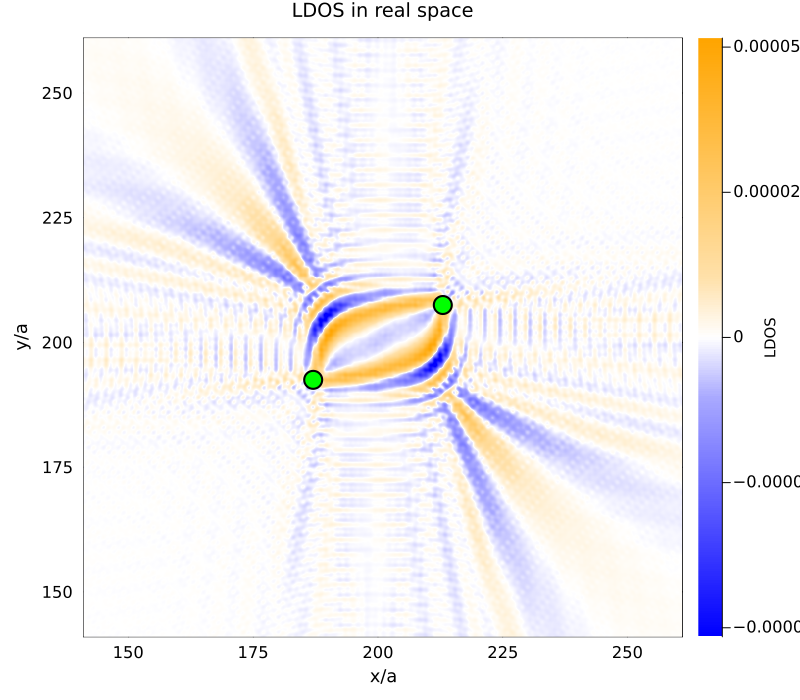

In [101]:
clim = minimum([maximum(Wannier_times_LDOS), abs(minimum(Wannier_times_LDOS))])
custom_cmap_symmetric = cgrad([:blue, :white, :orange], [0.4, 0.6])
p = heatmap(x_fine_grid, y_fine_grid, Wannier_times_LDOS', 
    xlabel="x/a", ylabel="y/a", 
    title="LDOS in real space",
    colorbar_title="LDOS", 
    c=custom_cmap_symmetric, 
    aspect_ratio=1, 
    clim=(-clim, clim),
    framestyle=:box,
    legend=false,
    size=(800, 700),
    margin=2Plots.mm,
    tickfontsize=11,
    guidefontsize=12,
    titlefontsize=13,
    colorbar=:right,
    xlims=(ROI_X[1], ROI_X[end]),
    ylims=(ROI_Y[1], ROI_Y[end])
)

scatter!(p, [200 - 15*cos(theta), 200 + 15*cos(theta)], [200 - 15*sin(theta), 200 + 15*sin(theta)],
    markersize=10,
    markercolor=:lime,
    markerstrokecolor=:black,
    markerstrokewidth=1.5,
    label=false
)

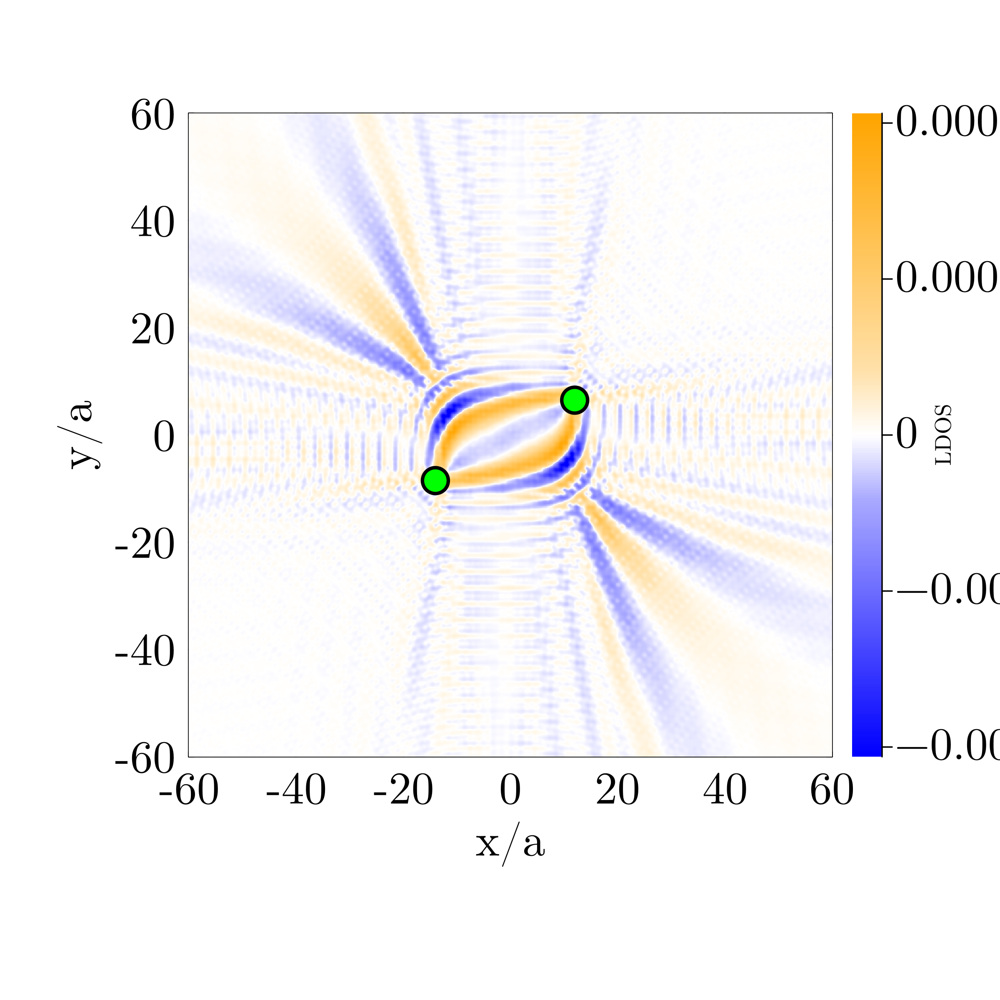

In [102]:
clim = minimum([maximum(Wannier_times_LDOS), abs(minimum(Wannier_times_LDOS))])
custom_cmap_symmetric = cgrad([:blue, :white, :orange], [0.4, 0.6])
# Re-label physical coordinates to centered axes for publication plots
tick_values = -60:20:60
xtick_positions = range(first(ROI_X), last(ROI_X), length=length(tick_values))
ytick_positions = range(first(ROI_Y), last(ROI_Y), length=length(tick_values))
tick_labels = string.(collect(tick_values))
p1 = heatmap(x_fine_grid, y_fine_grid, Wannier_times_LDOS', 
    xlabel="x/a", ylabel="y/a", 
    # title=("clim=",clim),
    colorbar_title="LDOS", 
    c=custom_cmap_symmetric,
    aspect_ratio=1, 
    clim=(-clim, clim),
    framestyle=:box,
    legend=false,
    size=(800, 800),
    dpi=300,
    margin=6Plots.mm,
    tickfontsize=20,
    guidefontsize=20,
    titlefontsize=16,
    fontfamily="Computer Modern",
    thickness_scaling=1.15,
    colorbar=:right,
    xticks=(xtick_positions, tick_labels),
    yticks=(ytick_positions, tick_labels),
    xlims=(ROI_X[1], ROI_X[end]),
    ylims=(ROI_Y[1], ROI_Y[end])
)


scatter!(p1, [200 - 15*cos(theta), 200 + 15*cos(theta)], [200 - 15*sin(theta), 200 + 15*sin(theta)],
    markersize=10,
    markercolor=:lime,
    markerstrokecolor=:black,
    markerstrokewidth=1.5,
    label=false
)

p1

In [103]:
### Export the plot p to pdf
savefig(p1, "LDOS_d+id_theta_$(theta_in_degree)_Wannier_times_LDOS_export.pdf")

"/home/archisman/Documents/GitHub/tunneling_conductance_tomography/strontium_ruthenate/square_bands_different_rotations_d+id/LDOS_d+id_theta_30_Wannier_times_LDOS_export.pdf"

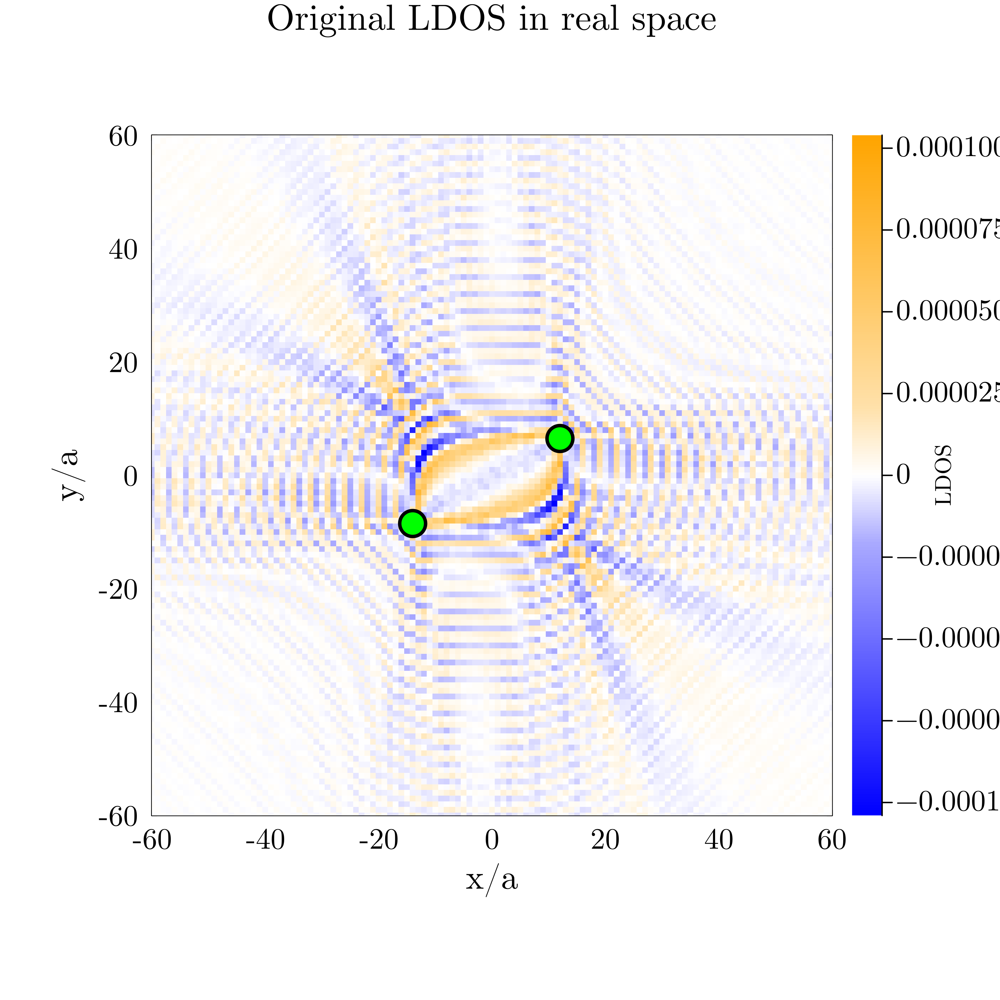

In [104]:
plot_x = 141:261
plot_y = 141:261
LDOS_plot = @view LDOS_full[plot_x, plot_y]

clip = maximum(abs.(LDOS_plot))
custom_cmap_symmetric = cgrad([:blue, :white, :orange], [0.4, 0.6])
tick_values = -60:20:60
xtick_positions = range(first(plot_x), last(plot_x), length=length(tick_values))
ytick_positions = range(first(plot_y), last(plot_y), length=length(tick_values))
tick_labels = string.(collect(tick_values))
p2 = heatmap(collect(plot_x), collect(plot_y), LDOS_plot',
    xlabel="x/a", ylabel="y/a",
    title="Original LDOS in real space",
    colorbar_title="LDOS",
    c=custom_cmap_symmetric,
    aspect_ratio=1,
    clim=(-clip, clip),
    framestyle=:box,
    legend=false,
    size=(800, 800),
    dpi=500,
    margin=6Plots.mm,
    tickfontsize=13,
    guidefontsize=15,
    titlefontsize=16,
    fontfamily="Computer Modern",
    thickness_scaling=1.15,
    colorbar=:right,
    xticks=(xtick_positions, tick_labels),
    yticks=(ytick_positions, tick_labels),
    xlims=(ROI_X[1], ROI_X[end]),
    ylims=(ROI_Y[1], ROI_Y[end])
)

scatter!(p2, [200 - 15*cos(theta), 200 + 15*cos(theta)], [200 - 15*sin(theta), 200 + 15*sin(theta)],
    markersize=10,
    markercolor=:lime,
    markerstrokecolor=:black,
    markerstrokewidth=1.5,
    label=false
)

p2

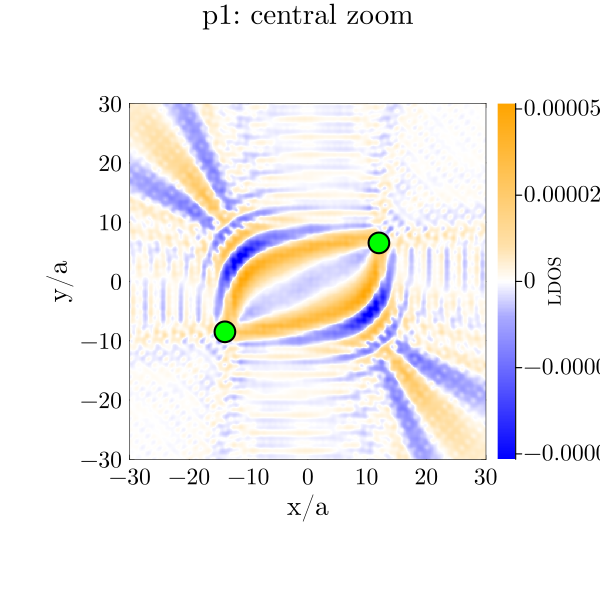

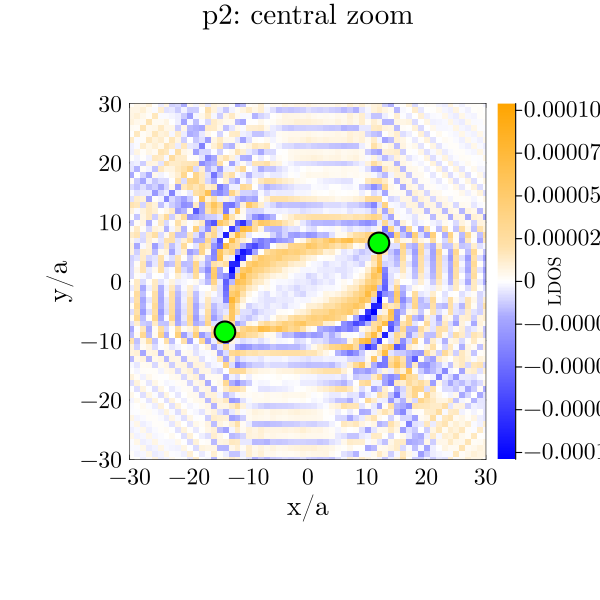

In [ ]:
# Zoom into the central region of p1 and p2 on centered axes
x_center = (first(ROI_X) + last(ROI_X)) / 2
y_center = (first(ROI_Y) + last(ROI_Y)) / 2
zoom_window = (-30, 30)
custom_cmap_symmetric = cgrad([:blue, :white, :orange], [0.4, 0.6])

# p1 zoom (Wannier-smoothed LDOS)
clim_p1 = minimum([maximum(Wannier_times_LDOS), abs(minimum(Wannier_times_LDOS))])
x_fine_centered = x_fine_grid .- x_center
y_fine_centered = y_fine_grid .- y_center

p1_zoom = heatmap(x_fine_centered, y_fine_centered, Wannier_times_LDOS',
    xlabel="x/a", ylabel="y/a",
    title="p1: central zoom",
    colorbar_title="LDOS",
    c=custom_cmap_symmetric,
    aspect_ratio=1,
    clim=(-clim_p1, clim_p1),
    framestyle=:box,
    legend=false,
    size=(600, 600),
    margin=6Plots.mm,
    tickfontsize=13,
    guidefontsize=15,
    titlefontsize=16,
    fontfamily="Computer Modern",
    thickness_scaling=1.15,
    colorbar=:right,
    xlims=zoom_window,
    ylims=zoom_window,
    xticks=-30:10:30,
    yticks=-30:10:30
)

scatter!(p1_zoom, [200 - 15*cos(theta), 200 + 15*cos(theta)] .- x_center, [200 - 15*sin(theta), 200 + 15*sin(theta)] .- y_center,
    markersize=10,
    markercolor=:lime,
    markerstrokecolor=:black,
    markerstrokewidth=1.5,
    label=false
)

# p2 zoom (original LDOS)
plot_x = 141:261
plot_y = 141:261
LDOS_plot = @view LDOS_full[plot_x, plot_y]
clip = maximum(abs.(LDOS_plot))
x_plot_centered = collect(plot_x) .- x_center
y_plot_centered = collect(plot_y) .- y_center

p2_zoom = heatmap(x_plot_centered, y_plot_centered, LDOS_plot',
    xlabel="x/a", ylabel="y/a",
    title="p2: central zoom",
    colorbar_title="LDOS",
    c=custom_cmap_symmetric,
    aspect_ratio=1,
    clim=(-clip, clip),
    framestyle=:box,
    legend=false,
    size=(600, 600),
    margin=6Plots.mm,
    tickfontsize=13,
    guidefontsize=15,
    titlefontsize=16,
    fontfamily="Computer Modern",
    thickness_scaling=1.15,
    colorbar=:right,
    xlims=zoom_window,
    ylims=zoom_window,
    xticks=-30:10:30,
    yticks=-30:10:30
)

scatter!(p2_zoom, [200 - 15*cos(theta), 200 + 15*cos(theta)] .- x_center, [200 - 15*sin(theta), 200 + 15*sin(theta)] .- y_center,
    markersize=10,
    markercolor=:lime,
    markerstrokecolor=:black,
    markerstrokewidth=1.5,
    label=false
)

display(p1_zoom)
display(p2_zoom)